In [1]:
import polars as pl
import plotly
import plotly.express as px

In [14]:
FILENAME_PARQUET = "results_final/AllGAID2.parquet"
GENENAME = "EGFR"
UNIQUEID = "Discovery_LUAD1"
OUTPUT_FIGURE_SVG = "output.svg"
OUTPUT_TABLE = "output.csv"

In [3]:
df = pl.read_parquet(FILENAME_PARQUET)
print(df)

shape: (1_467_848_550, 10)
┌────────────┬───────────┬──────────┬───────────┬───┬──────────┬────────────┬──────────┬───────────┐
│ UniqueID   ┆ QueryType ┆ Genename ┆ DataLevel ┆ … ┆ p_value  ┆ Z_differen ┆ FDR      ┆ SignedFDR │
│ ---        ┆ ---       ┆ ---      ┆ ---       ┆   ┆ ---      ┆ ce         ┆ ---      ┆ ---       │
│ str        ┆ str       ┆ str      ┆ str       ┆   ┆ f64      ┆ ---        ┆ f64      ┆ f64       │
│            ┆           ┆          ┆           ┆   ┆          ┆ f64        ┆          ┆           │
╞════════════╪═══════════╪══════════╪═══════════╪═══╪══════════╪════════════╪══════════╪═══════════╡
│ Validation ┆ Mutation  ┆ TP53     ┆ L1        ┆ … ┆ 0.00826  ┆ 1.39898    ┆ null     ┆ null      │
│ _HNSCC     ┆           ┆          ┆           ┆   ┆          ┆            ┆          ┆           │
│ Validation ┆ Mutation  ┆ TP53     ┆ L1        ┆ … ┆ 0.037724 ┆ 1.310381   ┆ null     ┆ null      │
│ _HNSCC     ┆           ┆          ┆           ┆   ┆          ┆

In [15]:
filtered_df = df.filter(pl.col('Genename') == GENENAME)
filtered_df = filtered_df.filter(pl.col('DataLevel') == "L2")
filtered_df = filtered_df.filter(pl.col('UniqueID') == UNIQUEID)
filtered_df = filtered_df.select(["UniqueID","DataType", "Targetname", "SignedFDR"])
print(filtered_df)

shape: (141_613, 4)
┌─────────────────┬─────────────────┬───────────────┬───────────┐
│ UniqueID        ┆ DataType        ┆ Targetname    ┆ SignedFDR │
│ ---             ┆ ---             ┆ ---           ┆ ---       │
│ str             ┆ str             ┆ str           ┆ f64       │
╞═════════════════╪═════════════════╪═══════════════╪═══════════╡
│ Discovery_LUAD1 ┆ Transcriptome   ┆ A1BG          ┆ 0.091211  │
│ Discovery_LUAD1 ┆ Transcriptome   ┆ A1BG-AS1      ┆ 0.39576   │
│ Discovery_LUAD1 ┆ Transcriptome   ┆ A1CF          ┆ -0.856055 │
│ Discovery_LUAD1 ┆ Transcriptome   ┆ A2M           ┆ -0.039133 │
│ Discovery_LUAD1 ┆ Transcriptome   ┆ A2M-AS1       ┆ 0.033766  │
│ …               ┆ …               ┆ …             ┆ …         │
│ Discovery_LUAD1 ┆ Phosphoproteome ┆ ZSCAN18:K422k ┆ 0.031841  │
│ Discovery_LUAD1 ┆ Phosphoproteome ┆ ZSCAN31:K215k ┆ 0.110341  │
│ Discovery_LUAD1 ┆ Phosphoproteome ┆ ZYX:K24k      ┆ 0.13289   │
│ Discovery_LUAD1 ┆ Phosphoproteome ┆ ZYX:K25k      ┆ -0

In [16]:
df_tra = filtered_df.filter(pl.col("DataType")=="Transcriptome")
df_tra = df_tra.rename({"SignedFDR": "SignedFDR_Transcriptome"})
df_pro = filtered_df.filter(pl.col("DataType")=="Proteome")
df_pro = df_pro.rename({"SignedFDR": "SignedFDR_Proteome"})
df_pho = filtered_df.filter(pl.col("DataType")=="Phosphoproteome")
df_pho = df_pho.rename({"SignedFDR": "SignedFDR_Proteome"})

In [17]:
# df_A와 df_B를 UniqueID와 Targetname을 기준으로 merge
merged_df = df_tra.join(df_pro.select(["UniqueID", "Targetname", "SignedFDR_Proteome"]),
                      on=["UniqueID", "Targetname"], 
                      how="left")
merged_df

UniqueID,DataType,Targetname,SignedFDR_Transcriptome,SignedFDR_Proteome
str,str,str,f64,f64
"""Discovery_LUAD1""","""Transcriptome""","""A1BG""",0.091211,-0.961521
"""Discovery_LUAD1""","""Transcriptome""","""A1BG-AS1""",0.39576,null
"""Discovery_LUAD1""","""Transcriptome""","""A1CF""",-0.856055,0.19511
"""Discovery_LUAD1""","""Transcriptome""","""A2M""",-0.039133,-0.573931
"""Discovery_LUAD1""","""Transcriptome""","""A2M-AS1""",0.033766,null
…,…,…,…,…
"""Discovery_LUAD1""","""Transcriptome""","""ZYX""",-0.070493,0.0546
"""Discovery_LUAD1""","""Transcriptome""","""ZYXP1""",null,null
"""Discovery_LUAD1""","""Transcriptome""","""ZZEF1""",-0.343764,-1.031961


In [18]:
df_pho = df_pho.with_columns(pl.col('Targetname').str.split(':').list.get(0).alias('GeneName'))
merged_df_gene = merged_df.select(['UniqueID', pl.col('Targetname').alias('GeneName'), 'SignedFDR_Transcriptome'])
df_pho = df_pho.join(merged_df_gene, on=['UniqueID', 'GeneName'], how='left').with_columns(pl.lit('Transcriptome').alias('DataType'))
df_pho_formatted = df_pho.select(['UniqueID', 'DataType', 'Targetname', 'SignedFDR_Transcriptome', 'SignedFDR_Proteome'])
merged_df_formatted = merged_df.select(['UniqueID', 'DataType', 'Targetname', 'SignedFDR_Transcriptome', 'SignedFDR_Proteome'])
df_merged = pl.concat([merged_df_formatted, df_pho_formatted]).sort(['UniqueID', 'Targetname'])
df_merged = df_merged.filter(pl.col("SignedFDR_Transcriptome").is_not_null() & pl.col("SignedFDR_Proteome").is_not_null())
df_merged = df_merged.with_columns(pl.when(pl.col("Targetname").str.contains(":")).then(pl.lit("Phosphoproteome")).otherwise(pl.lit("Proteome")).alias("DataType"))

print(df_merged)

uniqueid_list = df_merged.select(pl.col("UniqueID").unique()).to_series().to_list()
print(uniqueid_list)

shape: (71_183, 5)
┌─────────────────┬─────────────────┬──────────────┬─────────────────────────┬────────────────────┐
│ UniqueID        ┆ DataType        ┆ Targetname   ┆ SignedFDR_Transcriptome ┆ SignedFDR_Proteome │
│ ---             ┆ ---             ┆ ---          ┆ ---                     ┆ ---                │
│ str             ┆ str             ┆ str          ┆ f64                     ┆ f64                │
╞═════════════════╪═════════════════╪══════════════╪═════════════════════════╪════════════════════╡
│ Discovery_LUAD1 ┆ Proteome        ┆ A1BG         ┆ 0.091211                ┆ -0.961521          │
│ Discovery_LUAD1 ┆ Proteome        ┆ A1CF         ┆ -0.856055               ┆ 0.19511            │
│ Discovery_LUAD1 ┆ Proteome        ┆ A2M          ┆ -0.039133               ┆ -0.573931          │
│ Discovery_LUAD1 ┆ Phosphoproteome ┆ A2M:K1092k   ┆ -0.039133               ┆ -0.544358          │
│ Discovery_LUAD1 ┆ Phosphoproteome ┆ A2M:K1168k   ┆ -0.039133               ┆ -0

In [36]:
# Export
# OUTPUT_FIGURE_SVG
# plotly.offline.plot(fig, filename="test.html")
#df_merged.write_csv("filtered.csv")

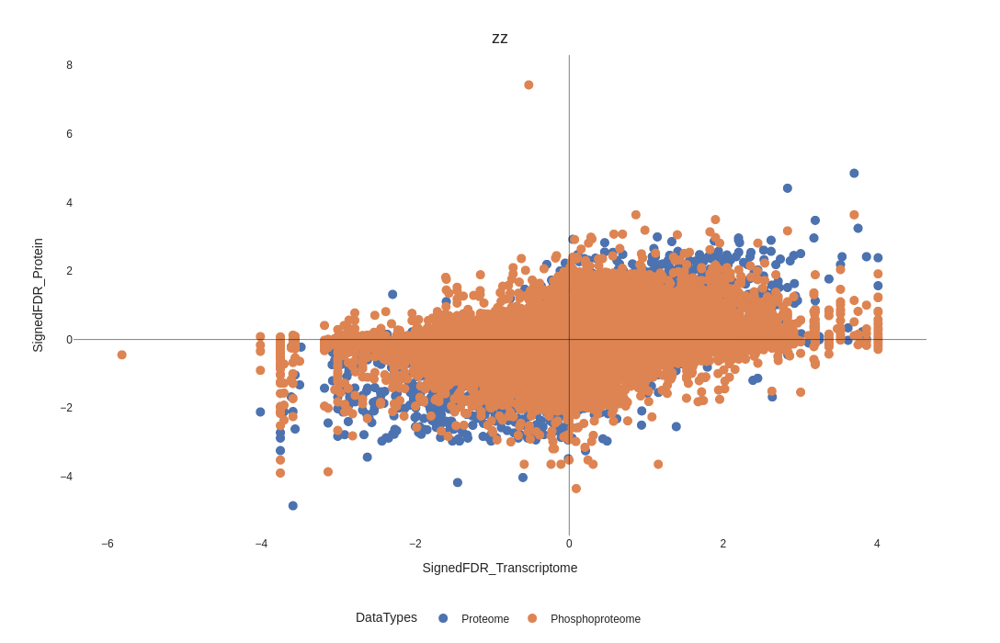

In [35]:
fig=px.scatter(df_merged, x="SignedFDR_Transcriptome", y="SignedFDR_Proteome", color="DataType",
			template="seaborn", width=650, height=700,
           labels={"SignedP_mRNA":"Signed -log<sub>10</sub>(<i>p</i>-value) RNA", 
					 "SignedP_type":"Signed -log<sub>10</sub>(<i>p</i>-value) Proteomics"},
           hover_data={'Targetname':True,'DataType':True, 'SignedFDR_Transcriptome':True, 'SignedFDR_Proteome':True},
          color_discrete_sequence=["#4C72B0","#DD8452","#55A868","#984EA3"],
          )

fig.add_hline(y=0, line_width=1, line_dash="solid")
fig.add_vline(x=0, line_width=1, line_dash="solid")

fig.update_layout(
    plot_bgcolor="white",  # Plot area background color
    #paper_bgcolor="white",  # Overall figure background color
	annotations=[dict(text="zz", showarrow=False, xref="paper", yref="paper", x=0.5, y=1.06, font=dict(size=18))],
	legend=dict(title="DataTypes", orientation="h", yanchor="bottom", y=-0.2, xanchor="center", x=0.5),
	xaxis=dict(title="SignedFDR_Transcriptome", title_font=dict(size=14)),
	yaxis=dict(title="SignedFDR_Protein", title_font=dict(size=14)),
	hoverlabel=dict(bgcolor="white")
	)
fig.update_traces(mode="markers",
                 marker=dict(size=10)
                 )